# Clustering and dimeonsionality reduction techniques combined


In this notebook, we show how the clustering performance changes when dimensionality reduction techniques like Principal component analysis (PCA), Independent component analysis (ICA), or Random projections (RP) is combined with algorithms like k-means.

[Read about ___k-means clustering algorithm___ here.](https://en.wikipedia.org/wiki/K-means_clustering)

[Read about ___principal component analysis___ here](https://en.wikipedia.org/wiki/Principal_component_analysis)

[Read about ___independent component analysis___ here](https://en.wikipedia.org/wiki/Independent_component_analysis)

---

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

### Create synthetic data using Scikit learn `make_blob` method

- Number of features: 8
- Number of clusters: 5
- Number of samples: 1000

In [2]:
from sklearn.datasets import make_classification
from sklearn.datasets import make_blobs

In [3]:
n_features = 8
n_cluster = 5
cluster_std = 1.5
n_samples = 1000

In [4]:
data1 = make_blobs(n_samples=n_samples,n_features=n_features,centers=n_cluster,cluster_std=cluster_std)

In [5]:
d1 = data1[0]

In [6]:
df1=pd.DataFrame(data=d1,columns=['Feature_'+str(i) for i in range(1,n_features+1)])
df1.head()

,Feature_1,Feature_2,Feature_3,Feature_4,Feature_5,Feature_6,Feature_7,Feature_8
0,-5.254028,-2.956039,8.126268,8.352459,-1.127186,-7.774282,-3.355732,-4.631575
1,-4.141250,0.688165,11.793831,6.993058,7.607095,0.460296,-2.119499,4.588101
2,4.669123,4.816172,-7.014447,-2.105525,8.294833,4.950852,4.860844,-1.185744
3,-4.372544,0.598779,9.671695,11.051964,6.912161,-3.623465,-4.112473,5.109172
4,-4.363617,-0.078470,9.580407,12.165112,5.487832,0.251104,-4.103726,5.611440


In [7]:
from itertools import combinations

In [8]:
lst_vars=list(combinations(df1.columns,2))

In [9]:
len(lst_vars)

28

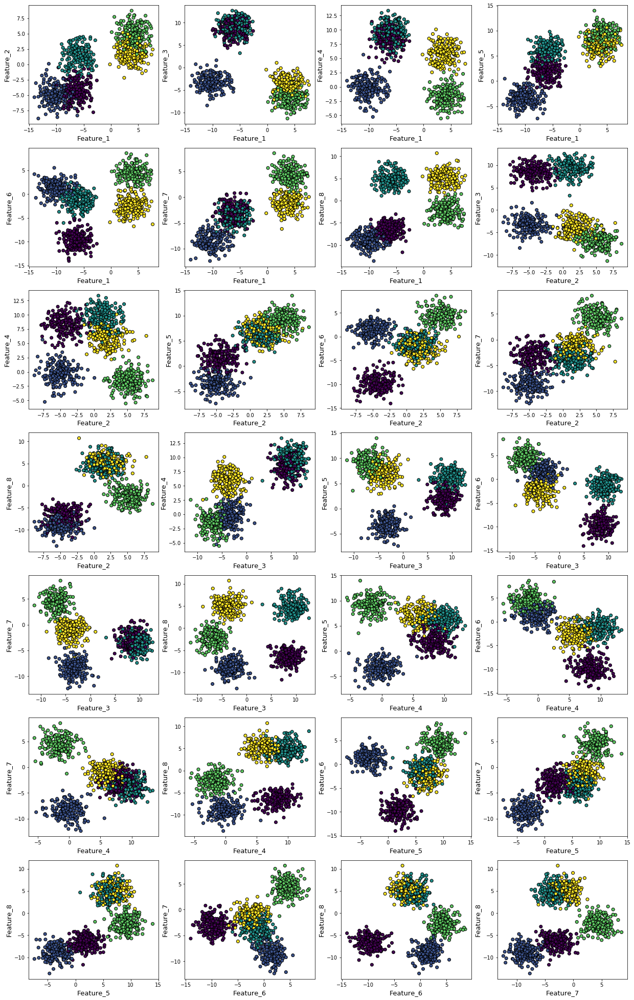

In [10]:
plt.figure(figsize=(21,35))
for i in range(1,29):
    plt.subplot(7,4,i)
    dim1=lst_vars[i-1][0]
    dim2=lst_vars[i-1][1]
    plt.scatter(df1[dim1],df1[dim2],c=data1[1],edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)

Only for some features there is a somewhat clear two feature split otherwise more feature for splitting are required

In [12]:
df1.describe().T

,count,mean,std,min,25%,50%,75%,max
Feature_1,1000.0,-2.883677,5.976487,-14.022530,-7.588124,-5.078293,3.448954,7.662477
Feature_2,1000.0,-0.208693,4.133316,-8.822715,-4.313547,0.651065,3.044488,8.736018
Feature_3,1000.0,0.741487,6.914712,-11.355205,-5.044369,-2.543212,8.473372,12.663885
Feature_4,1000.0,4.435811,4.773030,-5.548465,-0.349715,5.844181,8.496387,13.357539
Feature_5,1000.0,4.217707,4.704306,-7.421052,0.869870,5.720650,7.802020,13.972750
Feature_6,1000.0,-1.520056,4.943550,-14.043284,-3.743015,-0.939276,2.186410,8.629504
Feature_7,1000.0,-2.368954,4.402286,-12.381632,-5.001860,-2.573893,0.088438,8.539472
Feature_8,1000.0,-1.580554,5.909008,-13.629762,-7.016855,-2.399889,4.441943,10.703934


### How are the classes separated (boxplots)

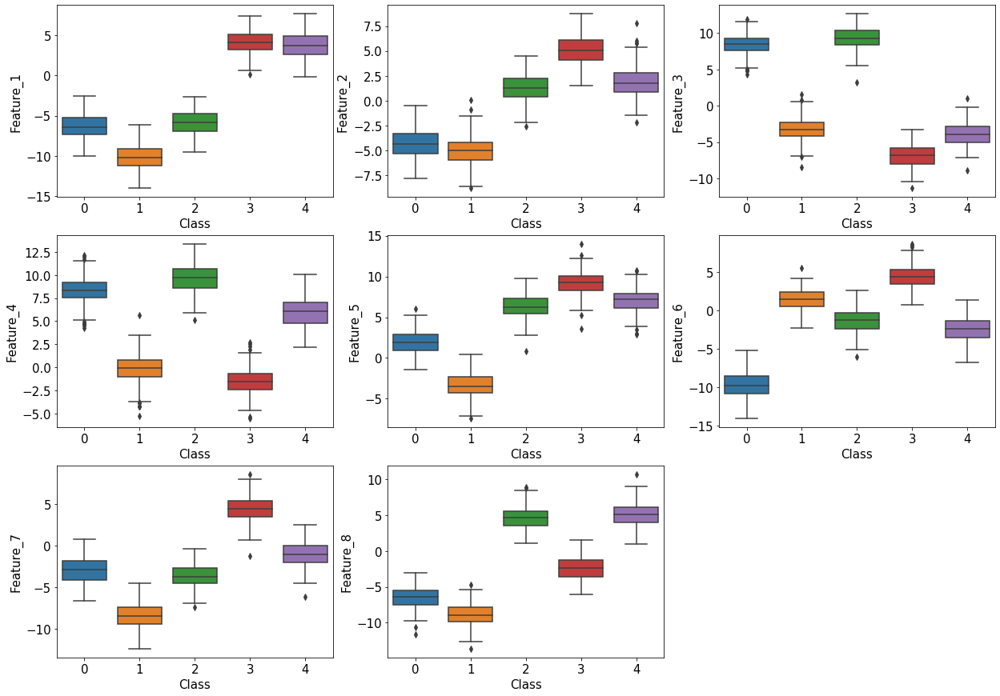

In [13]:
plt.figure(figsize=(21,15))
for i,c in enumerate(df1.columns):
    plt.subplot(3,3,i+1)
    sns.boxplot(y=df1[c],x=data1[1])
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    plt.xlabel("Class",fontsize=15)
    plt.ylabel(c,fontsize=15)
    #plt.show()

Clear singular feature

## k-means clustering

In [14]:
from sklearn.cluster import KMeans

### Unlabled data

In [15]:
X=df1

In [16]:
X.head()

,Feature_1,Feature_2,Feature_3,Feature_4,Feature_5,Feature_6,Feature_7,Feature_8
0,-5.254028,-2.956039,8.126268,8.352459,-1.127186,-7.774282,-3.355732,-4.631575
1,-4.141250,0.688165,11.793831,6.993058,7.607095,0.460296,-2.119499,4.588101
2,4.669123,4.816172,-7.014447,-2.105525,8.294833,4.950852,4.860844,-1.185744
3,-4.372544,0.598779,9.671695,11.051964,6.912161,-3.623465,-4.112473,5.109172
4,-4.363617,-0.078470,9.580407,12.165112,5.487832,0.251104,-4.103726,5.611440


In [17]:
y=data1[1]

### Scaling

In [75]:
from sklearn.preprocessing import MinMaxScaler

In [76]:
scaler = MinMaxScaler()

In [20]:
X_scaled=scaler.fit_transform(X)

### Metrics

In [21]:
from sklearn.metrics import silhouette_score, adjusted_rand_score, completeness_score, v_measure_score

### Running k-means and computing inter-cluster distance score for various *k* values

In [22]:
km_scores= []
km_silhouette = []
vmeasure_score =[]
for i in range(2,12):
    km = KMeans(n_clusters=i, random_state=0).fit(X_scaled)
    preds = km.predict(X_scaled)
    print("Score for number of cluster(s) {}: {}".format(i,km.score(X_scaled)))
    km_scores.append(-km.score(X_scaled))
    silhouette = silhouette_score(X_scaled,preds)
    km_silhouette.append(silhouette)
    print("Silhouette score for number of cluster(s) {}: {}".format(i,silhouette))
    v_measure = v_measure_score(y,preds)
    vmeasure_score.append(v_measure)
    print("V-measure score for number of cluster(s) {}: {}".format(i,v_measure))
    print("-"*100)

Score for number of cluster(s) 2: -263.4848625336755
Silhouette score for number of cluster(s) 2: 0.4369607102896667
V-measure score for number of cluster(s) 2: 0.589727521756156
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 3: -137.4577663697807
Silhouette score for number of cluster(s) 3: 0.5459281579224771
V-measure score for number of cluster(s) 3: 0.7918756684685214
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 4: -87.13069493643536
Silhouette score for number of cluster(s) 4: 0.5844565535087642
V-measure score for number of cluster(s) 4: 0.9057460992755191
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 5: -39.88527600829022
Silhouette score for number of cluster(s) 5: 0.6426273847746351
V-measure score for number of cluster(s) 

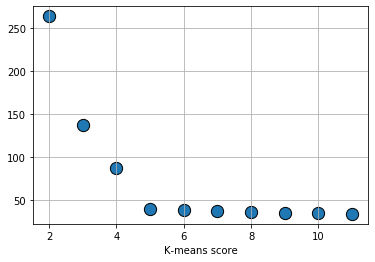

In [23]:
plt.scatter(x=[i for i in range(2,12)],y=km_scores,s=150,edgecolor='k')
plt.grid(True)
plt.xlabel("K-means score")
plt.show()

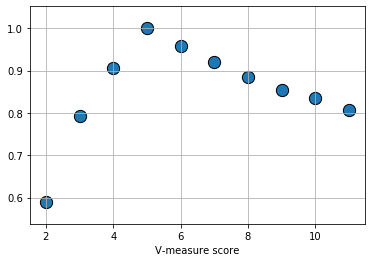

In [24]:
plt.scatter(x=[i for i in range(2,12)],y=vmeasure_score,s=150,edgecolor='k')
plt.grid(True)
plt.xlabel("V-measure score")
plt.show()

In [28]:
km = KMeans(n_clusters=5,n_init=10,max_iter=500).fit(X=X_scaled)

In [29]:
preds_km = km.predict(X_scaled)

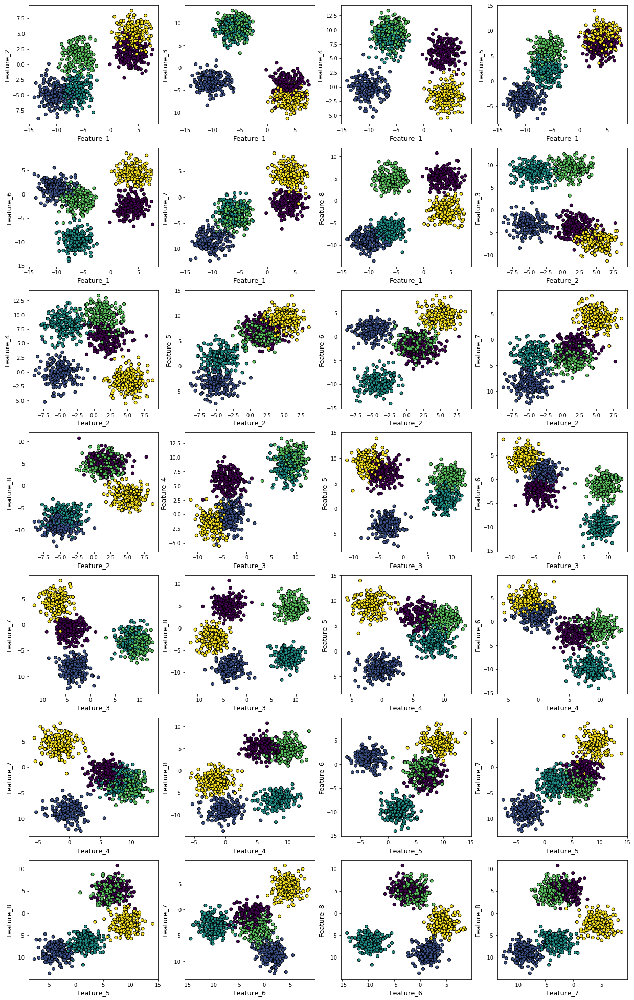

In [30]:
plt.figure(figsize=(21,35))
for i in range(1,29):
    plt.subplot(7,4,i)
    dim1=lst_vars[i-1][0]
    dim2=lst_vars[i-1][1]
    plt.scatter(df1[dim1],df1[dim2],c=preds_km,edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)

## Expectation-maximization (Gaussian Mixture Model)

In [31]:
from sklearn.mixture import GaussianMixture

In [32]:
gm_bic= []
gm_score=[]
for i in range(2,12):
    gm = GaussianMixture(n_components=i,n_init=10,tol=1e-3,max_iter=1000).fit(X_scaled)
    print("BIC for number of cluster(s) {}: {}".format(i,gm.bic(X_scaled)))
    print("Log-likelihood score for number of cluster(s) {}: {}".format(i,gm.score(X_scaled)))
    print("-"*100)
    gm_bic.append(-gm.bic(X_scaled))
    gm_score.append(gm.score(X_scaled))

BIC for number of cluster(s) 2: -12829.801484970221
Log-likelihood score for number of cluster(s) 2: 6.7222958523998155
----------------------------------------------------------------------------------------------------
BIC for number of cluster(s) 3: -14338.987256444589
Log-likelihood score for number of cluster(s) 3: 7.632313231914098
----------------------------------------------------------------------------------------------------
BIC for number of cluster(s) 4: -14841.30851693564
Log-likelihood score for number of cluster(s) 4: 8.038898355936722
----------------------------------------------------------------------------------------------------
BIC for number of cluster(s) 5: -15271.895240415066
Log-likelihood score for number of cluster(s) 5: 8.409616211453534
----------------------------------------------------------------------------------------------------
BIC for number of cluster(s) 6: -15025.76579411753
Log-likelihood score for number of cluster(s) 6: 8.441975982081862
--

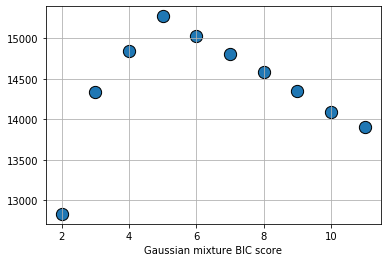

In [34]:
plt.scatter(x=[i for i in range(2,12)],y=gm_bic,s=150,edgecolor='k')
plt.grid(True)
plt.xlabel("Gaussian mixture BIC score")
plt.show()

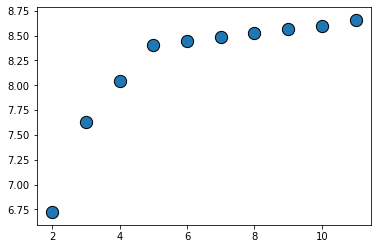

In [35]:
plt.scatter(x=[i for i in range(2,12)],y=gm_score,s=150,edgecolor='k')
plt.show()

In [55]:
gm = GaussianMixture(n_components=5,verbose=1,n_init=10,tol=1e-2,covariance_type='full',max_iter=5).fit(X_scaled)

Initialization 0
Initialization converged: True
Initialization 1
Initialization converged: True
Initialization 2
Initialization converged: True
Initialization 3
Initialization converged: True
Initialization 4
Initialization converged: True
Initialization 5
Initialization converged: True
Initialization 6
Initialization converged: True
Initialization 7
Initialization converged: True
Initialization 8
Initialization converged: True
Initialization 9
Initialization converged: True


In [56]:
gm.means_

array([[0.83751557, 0.7916094 , 0.18654572, 0.20972885, 0.77614736,
        0.81510766, 0.80013445, 0.46290473],
       [0.35636689, 0.25471641, 0.82400546, 0.7335732 , 0.43608304,
        0.19391748, 0.45200076, 0.2926306 ],
       [0.1795448 , 0.21836618, 0.33781512, 0.28383178, 0.18958244,
        0.68023026, 0.18649675, 0.19510265],
       [0.37411894, 0.57738088, 0.85890197, 0.80447605, 0.64038001,
        0.56155537, 0.41595381, 0.75566837],
       [0.82078436, 0.61084391, 0.31087287, 0.608894  , 0.67793124,
        0.51092014, 0.53837539, 0.76952139]])

In [57]:
km.cluster_centers_

array([[0.82078436, 0.61084391, 0.31087287, 0.608894  , 0.67793124,
        0.51092014, 0.53837539, 0.76952139],
       [0.1795448 , 0.21836618, 0.33781512, 0.28383178, 0.18958244,
        0.68023026, 0.18649675, 0.19510265],
       [0.35636689, 0.25471641, 0.82400546, 0.7335732 , 0.43608304,
        0.19391748, 0.45200076, 0.2926306 ],
       [0.37411894, 0.57738088, 0.85890197, 0.80447605, 0.64038001,
        0.56155537, 0.41595381, 0.75566837],
       [0.83751557, 0.7916094 , 0.18654572, 0.20972885, 0.77614736,
        0.81510766, 0.80013445, 0.46290473]])

In [58]:
gm.means_/km.cluster_centers_

array([[1.02038441, 1.29592746, 0.60007075, 0.3444423 , 1.14487623,
        1.59537195, 1.48620176, 0.60154888],
       [1.98483549, 1.16646455, 2.43922018, 2.58453515, 2.30022905,
        0.28507623, 2.42363881, 1.49988017],
       [0.50382009, 0.85729138, 0.40996709, 0.38691677, 0.43473931,
        3.50783364, 0.41260273, 0.66671993],
       [1.        , 1.        , 1.        , 1.        , 1.        ,
        1.        , 1.        , 1.        ],
       [0.98002281, 0.77164813, 1.66647016, 2.9032439 , 0.87345687,
        0.62681308, 0.67285615, 1.66237529]])

Equal class center but not unique labeling

In [59]:
preds_gm=gm.predict(X_scaled)

In [60]:
km_rand_score = adjusted_rand_score(preds_km,y)

In [61]:
gm_rand_score = adjusted_rand_score(preds_gm,y)

In [62]:
print("Adjusted Rand score for k-means",km_rand_score)
print("Adjusted Rand score for Gaussian Mixture model",gm_rand_score)

Adjusted Rand score for k-means 1.0
Adjusted Rand score for Gaussian Mixture model 1.0


In [63]:
silhouette_score(X_scaled,preds_km)

0.6426273847746351

In [64]:
silhouette_score(X_scaled,preds_gm)

0.6426273847746351

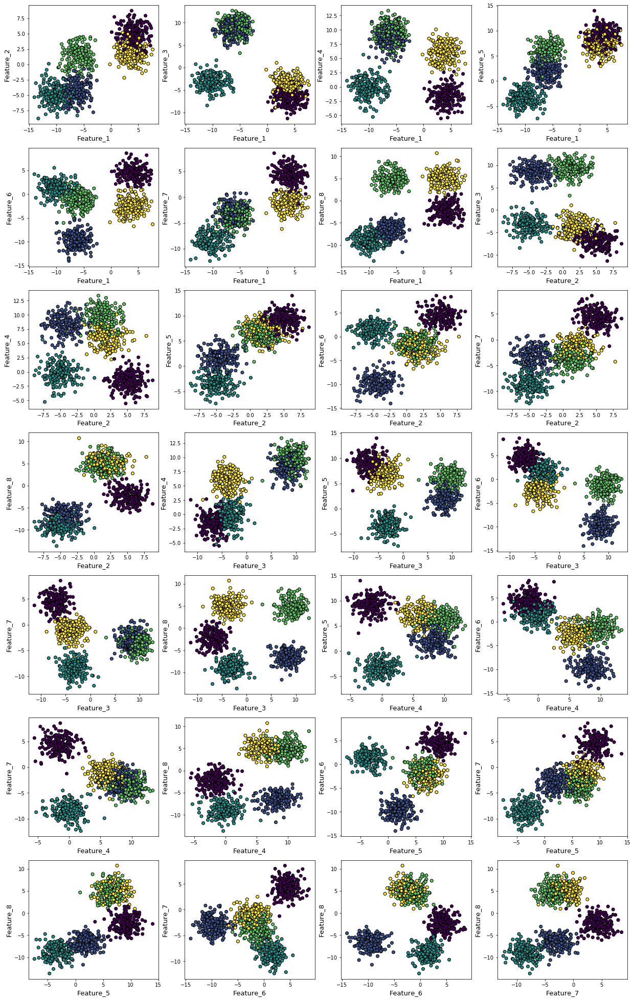

In [65]:
plt.figure(figsize=(21,35))
for i in range(1,29):
    plt.subplot(7,4,i)
    dim1=lst_vars[i-1][0]
    dim2=lst_vars[i-1][1]
    plt.scatter(df1[dim1],df1[dim2],c=preds_gm,edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)

## PCA

In [66]:
from sklearn.decomposition import PCA

In [67]:
n_prin_comp = 3

In [68]:
# pca based on singular value decomposition for some features
pca_partial = PCA(n_components=n_prin_comp,svd_solver='full')
pca_partial.fit(X_scaled)

PCA(copy=True, iterated_power='auto', n_components=3, random_state=None,
    svd_solver='full', tol=0.0, whiten=False)

In [69]:
# pca for all features based on singular value decomposition
pca_full = PCA(n_components=n_features,svd_solver='full')
pca_full.fit(X_scaled)

PCA(copy=True, iterated_power='auto', n_components=8, random_state=None,
    svd_solver='full', tol=0.0, whiten=False)

### How much variance is explained by principal components?

With the help of this plot, we can decide to work with only the first 3 principal components

In [70]:
pca_explained_var = pca_full.explained_variance_ratio_

In [73]:
pca_explained_var

array([0.50921471, 0.31625454, 0.07770347, 0.053573  , 0.01337112,
       0.01131174, 0.00974572, 0.0088257 ])

In [71]:
cum_explaiend_var = pca_explained_var.cumsum()

In [72]:
cum_explaiend_var

array([0.50921471, 0.82546925, 0.90317271, 0.95674572, 0.97011684,
       0.98142858, 0.9911743 , 1.        ])

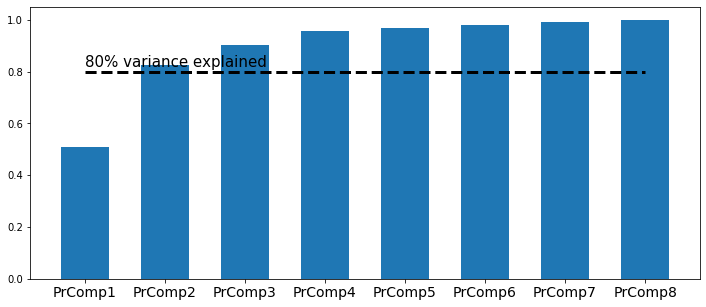

In [74]:
plt.figure(figsize=(12,5))
plt.bar(x=['PrComp'+str(i) for i in range(1,9)],height=cum_explaiend_var,width=0.6)
plt.xticks(fontsize=14)
plt.hlines(y=0.8,xmin='PrComp1',xmax='PrComp8',linestyles='dashed',lw=3)
plt.text(x='PrComp1',y=0.82,s="80% variance explained",fontsize=15)
plt.show()

### Transform the original variables in principal component space and create a DataFrame

In [78]:
X_pca = pca_partial.fit_transform(X_scaled)

In [79]:
df_pca=pd.DataFrame(data=X_pca,columns=['Principal_comp'+str(i) for i in range(1,n_prin_comp+1)])

### Running k-means on the transformed features

In [80]:
km_scores= []
km_silhouette = []
vmeasure_score =[]
for i in range(2,12):
    km = KMeans(n_clusters=i, random_state=0).fit(X_pca)
    preds = km.predict(X_pca)
    print("Score for number of cluster(s) {}: {}".format(i,km.score(X_pca)))
    km_scores.append(-km.score(X_pca))
    silhouette = silhouette_score(X_pca,preds)
    km_silhouette.append(silhouette)
    print("Silhouette score for number of cluster(s) {}: {}".format(i,silhouette))
    v_measure = v_measure_score(y,preds)
    vmeasure_score.append(v_measure)
    print("V-measure score for number of cluster(s) {}: {}".format(i,v_measure))
    print("-"*100)

Score for number of cluster(s) 2: -219.0607438257608
Silhouette score for number of cluster(s) 2: 0.493408683401007
V-measure score for number of cluster(s) 2: 0.589727521756156
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 3: -94.85475174903411
Silhouette score for number of cluster(s) 3: 0.6294020773451078
V-measure score for number of cluster(s) 3: 0.7871485791920712
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 4: -45.111635131185345
Silhouette score for number of cluster(s) 4: 0.7022008642243375
V-measure score for number of cluster(s) 4: 0.9017229806745894
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 5: -14.377648593668487
Silhouette score for number of cluster(s) 5: 0.7615028502529967
V-measure score for number of cluster(s)

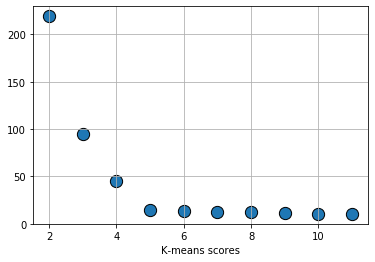

In [81]:
plt.scatter(x=[i for i in range(2,12)],y=km_scores,s=150,edgecolor='k')
plt.grid(True)
plt.xlabel("K-means scores")
plt.show()

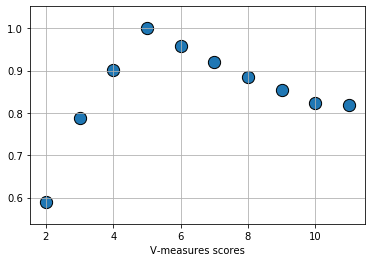

In [82]:
plt.scatter(x=[i for i in range(2,12)],y=vmeasure_score,s=150,edgecolor='k')
plt.grid(True)
plt.xlabel("V-measures scores")
plt.show()

### K-means fitting with PCA-transformed data

In [83]:
km_pca = KMeans(n_clusters=5,n_init=10,max_iter=500).fit(X=X_pca)
preds_km_pca = km_pca.predict(X_pca)

### Visualizing the clusters after running k-means on PCA-transformed features

In [84]:
col_pca_combi=list(combinations(df_pca.columns,2))
num_pca_combi = len(col_pca_combi)

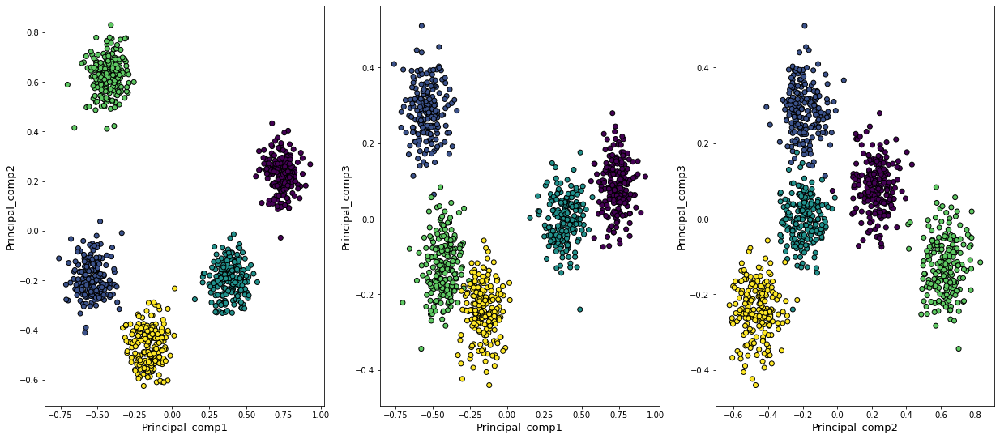

In [85]:
plt.figure(figsize=(21,20))
for i in range(1,num_pca_combi+1):
    plt.subplot(int(num_pca_combi/3)+1,3,i)
    dim1=col_pca_combi[i-1][0]
    dim2=col_pca_combi[i-1][1]
    plt.scatter(df_pca[dim1],df_pca[dim2],c=preds_km_pca,edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)

PCA allows more clear split with inly two comps

## ICA

In [86]:
from sklearn.decomposition import FastICA

In [87]:
n_ind_comp = 3

In [88]:
ica_partial = FastICA(n_components=n_ind_comp)
ica_partial.fit(X_scaled)

FastICA(algorithm='parallel', fun='logcosh', fun_args=None, max_iter=200,
        n_components=3, random_state=None, tol=0.0001, w_init=None,
        whiten=True)

In [89]:
ica_full = FastICA(max_iter=1000)
ica_full.fit(X_scaled)

/Users/peterniksa/anaconda3/lib/python3.7/site-packages/sklearn/decomposition/fastica_.py:119: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  ConvergenceWarning)


FastICA(algorithm='parallel', fun='logcosh', fun_args=None, max_iter=1000,
        n_components=None, random_state=None, tol=0.0001, w_init=None,
        whiten=True)

In [90]:
X_ica = ica_partial.fit_transform(X_scaled)

In [91]:
df_ica=pd.DataFrame(data=X_ica,columns=['Independent_comp'+str(i) for i in range(1,n_ind_comp+1)])

### Running k-means on the independent features

In [92]:
km_scores= []
km_silhouette = []
vmeasure_score =[]
for i in range(2,12):
    km = KMeans(n_clusters=i, random_state=0).fit(X_ica)
    preds = km.predict(X_ica)
    print("Score for number of cluster(s) {}: {}".format(i,km.score(X_ica)))
    km_scores.append(-km.score(X_ica))
    silhouette = silhouette_score(X_ica,preds)
    km_silhouette.append(silhouette)
    print("Silhouette score for number of cluster(s) {}: {}".format(i,silhouette))
    v_measure = v_measure_score(y,preds)
    vmeasure_score.append(v_measure)
    print("V-measure score for number of cluster(s) {}: {}".format(i,v_measure))
    print("-"*100)

Score for number of cluster(s) 2: -2.035751170127063
Silhouette score for number of cluster(s) 2: 0.411682975260354
V-measure score for number of cluster(s) 2: 0.589727521756156
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 3: -1.1398410397646919
Silhouette score for number of cluster(s) 3: 0.5653993120245858
V-measure score for number of cluster(s) 3: 0.7424834172925042
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 4: -0.36293297662353996
Silhouette score for number of cluster(s) 4: 0.6955752173030891
V-measure score for number of cluster(s) 4: 0.8986444595625165
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 5: -0.17586386031077939
Silhouette score for number of cluster(s) 5: 0.7142243315968347
V-measure score for number of cluster

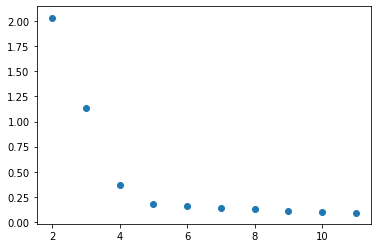

In [93]:
plt.scatter(x=[i for i in range(2,12)],y=km_scores)
plt.show()

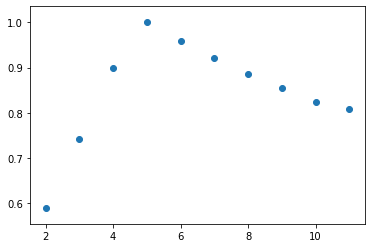

In [94]:
plt.scatter(x=[i for i in range(2,12)],y=vmeasure_score)
plt.show()

### K-means fitting with ICA-transformed data

In [95]:
km_ica = KMeans(n_clusters=5,n_init=10,max_iter=500).fit(X=X_ica)
preds_km_ica = km_ica.predict(X_ica)

### Visualizing the clusters after running k-means on ICA-transformed features

In [96]:
col_ica_combi=list(combinations(df_ica.columns,2))
num_ica_combi = len(col_ica_combi)

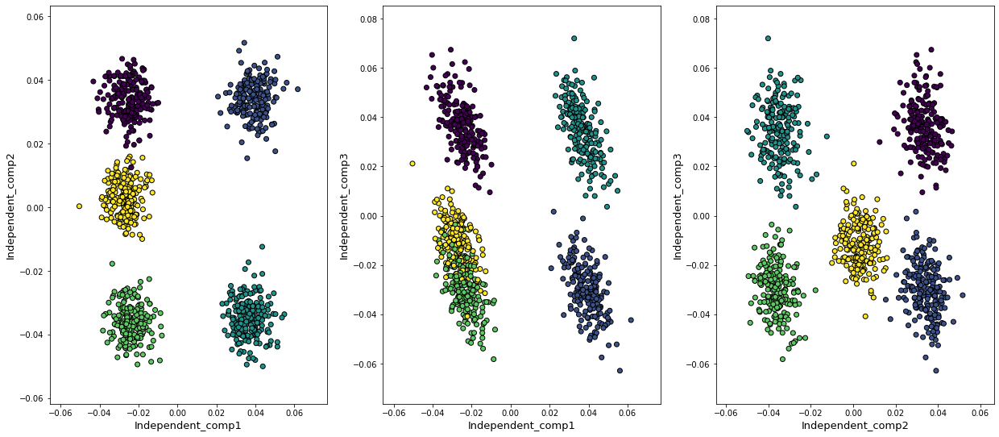

In [97]:
plt.figure(figsize=(21,20))
for i in range(1,num_ica_combi+1):
    plt.subplot(int(num_ica_combi/3)+1,3,i)
    dim1=col_ica_combi[i-1][0]
    dim2=col_ica_combi[i-1][1]
    plt.scatter(df_ica[dim1],df_ica[dim2],c=preds_km_ica,edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)

## Random Projection

In [98]:
from sklearn.random_projection import GaussianRandomProjection

In [99]:
n_random_comp = 3

In [100]:
random_proj = GaussianRandomProjection(n_components=n_random_comp)

In [101]:
X_random_proj = random_proj.fit_transform(X_scaled)

In [102]:
df_random_proj=pd.DataFrame(data=X_random_proj,columns=['Random_projection'+str(i) for i in range(1,n_random_comp+1)])

### Running k-means on random projections

In [105]:
km_scores= []
km_silhouette = []
vmeasure_score = []
for i in range(2,12):
    km = KMeans(n_clusters=i, random_state=0).fit(X_random_proj)
    preds = km.predict(X_random_proj)
    print("Score for number of cluster(s) {}: {}".format(i,km.score(X_random_proj)))
    km_scores.append(-km.score(X_random_proj))
    silhouette = silhouette_score(X_random_proj,preds)
    km_silhouette.append(silhouette)
    print("Silhouette score for number of cluster(s) {}: {}".format(i,silhouette))
    v_measure = v_measure_score(y,preds)
    vmeasure_score.append(v_measure)
    print("V-measure score for number of cluster(s) {}: {}".format(i,v_measure))
    print("-"*100)

Score for number of cluster(s) 2: -186.1067930122141
Silhouette score for number of cluster(s) 2: 0.44190688954594054
V-measure score for number of cluster(s) 2: 0.4287196254218462
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 3: -93.51270983073962
Silhouette score for number of cluster(s) 3: 0.4883658084743592
V-measure score for number of cluster(s) 3: 0.6872217829455399
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 4: -65.84773142144266
Silhouette score for number of cluster(s) 4: 0.4699843660780896
V-measure score for number of cluster(s) 4: 0.8073417664446811
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 5: -51.07331627918579
Silhouette score for number of cluster(s) 5: 0.4497417861427466
V-measure score for number of cluster(s

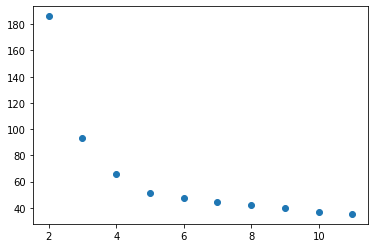

In [106]:
plt.scatter(x=[i for i in range(2,12)],y=km_scores)
plt.show()

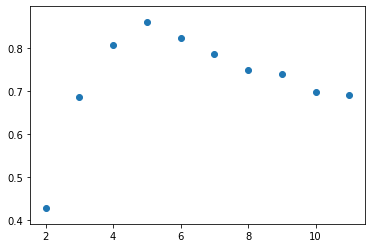

In [107]:
plt.scatter(x=[i for i in range(2,12)],y=vmeasure_score)
plt.show()

### K-means fitting with random-projected data

In [108]:
km_random_proj = KMeans(n_clusters=5,n_init=10,max_iter=500).fit(X=X_random_proj)
preds_km_random_proj = km_random_proj.predict(X_random_proj)

### Visualizing the clusters after running k-means on random-projected features

In [109]:
col_random_proj_combi=list(combinations(df_random_proj.columns,2))
num_random_proj_combi = len(col_random_proj_combi)

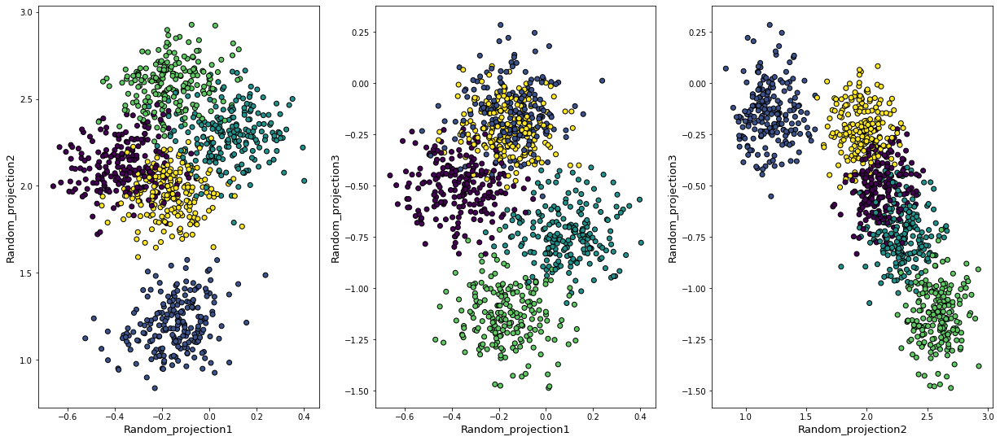

In [110]:
plt.figure(figsize=(21,20))
for i in range(1,num_random_proj_combi+1):
    plt.subplot(int(num_random_proj_combi/3)+1,3,i)
    dim1=col_random_proj_combi[i-1][0]
    dim2=col_random_proj_combi[i-1][1]
    plt.scatter(df_random_proj[dim1],df_random_proj[dim2],c=preds_km_random_proj,edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)
plt.show()

In [111]:
def plot_cluster_rp(df_rp,preds_rp):
    """
    Plots clusters after running random projection
    """
    plt.figure(figsize=(21,12))
    for i in range(1,num_random_proj_combi+1):
        plt.subplot(int(num_random_proj_combi/3)+1,3,i)
        dim1=col_random_proj_combi[i-1][0]
        dim2=col_random_proj_combi[i-1][1]
        plt.scatter(df_rp[dim1],df_rp[dim2],c=preds_rp,edgecolor='k')
        plt.xlabel(f"{dim1}",fontsize=13)
        plt.ylabel(f"{dim2}",fontsize=13)
    plt.show()

### Running the random projections many times

Score for iteration 0: -27.354543145141555
Silhouette score for iteration 0: 0.5909177494599528
V-measure score for iteration 0: 0.9383791115888027
----------------------------------------------------------------------------------------------------


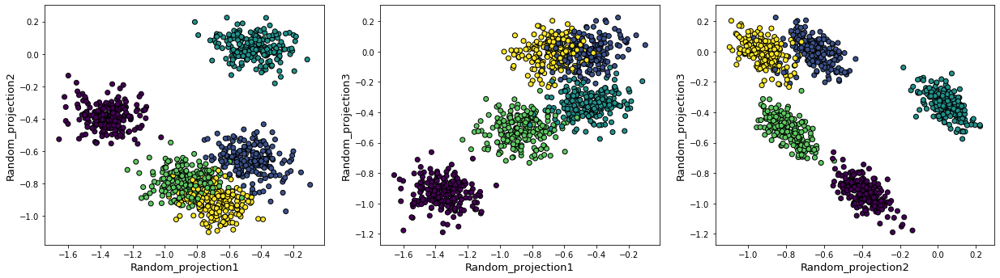

Score for iteration 1: -34.494881107468885
Silhouette score for iteration 1: 0.540671831323001
V-measure score for iteration 1: 0.9784989150140491
----------------------------------------------------------------------------------------------------


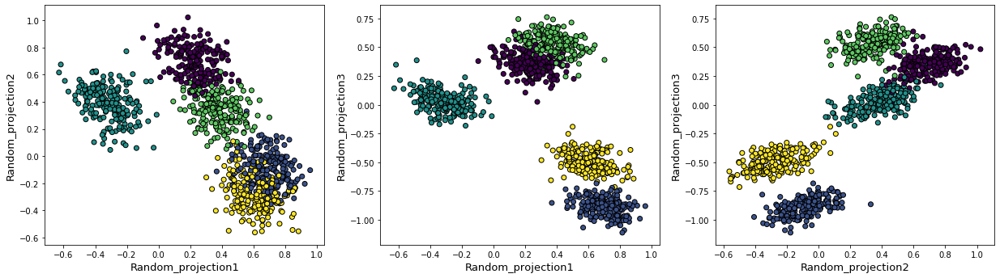

Score for iteration 2: -37.6657525654736
Silhouette score for iteration 2: 0.5347525162668795
V-measure score for iteration 2: 0.878325677741207
----------------------------------------------------------------------------------------------------


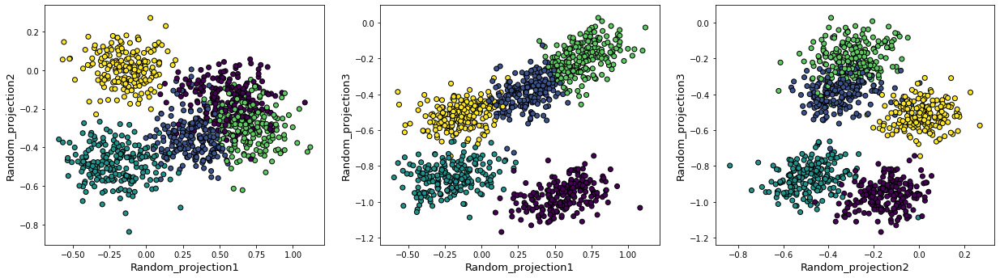

Score for iteration 3: -23.53351876168172
Silhouette score for iteration 3: 0.5532907182418603
V-measure score for iteration 3: 0.9067183817210772
----------------------------------------------------------------------------------------------------


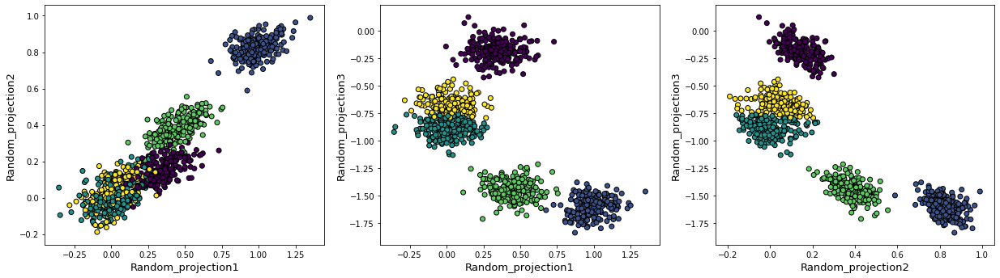

Score for iteration 4: -35.34007999910351
Silhouette score for iteration 4: 0.5344078952956439
V-measure score for iteration 4: 0.8889276108573513
----------------------------------------------------------------------------------------------------


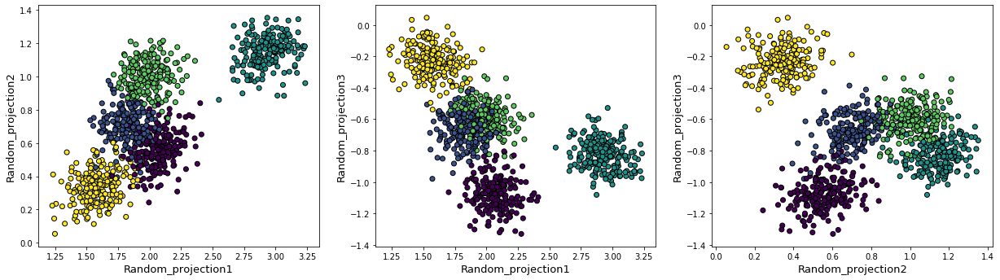

Score for iteration 5: -28.047837436926756
Silhouette score for iteration 5: 0.6239506470718188
V-measure score for iteration 5: 0.9891274791546505
----------------------------------------------------------------------------------------------------


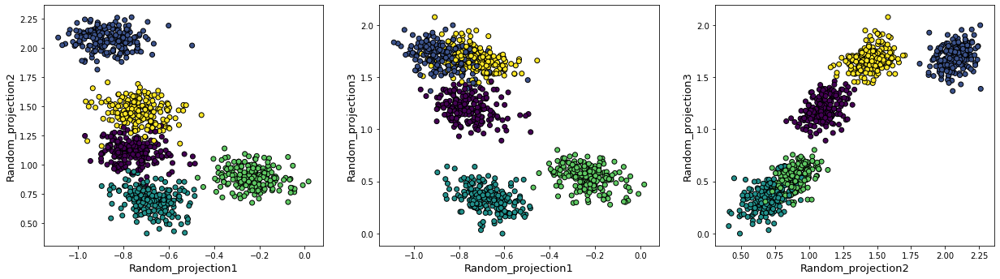

Score for iteration 6: -25.025482110096455
Silhouette score for iteration 6: 0.42975832879645565
V-measure score for iteration 6: 0.7475726696342985
----------------------------------------------------------------------------------------------------


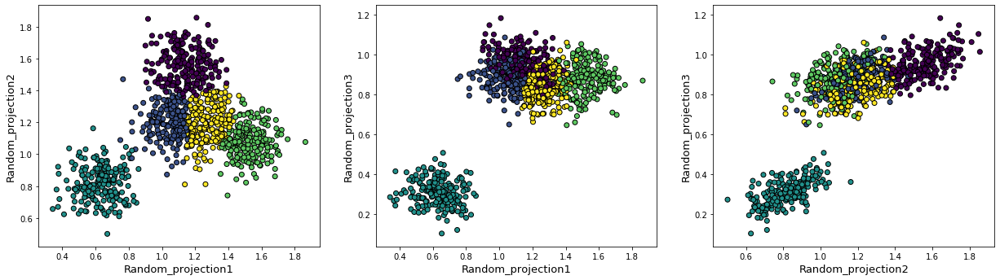

Score for iteration 7: -31.260533274758316
Silhouette score for iteration 7: 0.5723053932698076
V-measure score for iteration 7: 0.8250604923242695
----------------------------------------------------------------------------------------------------


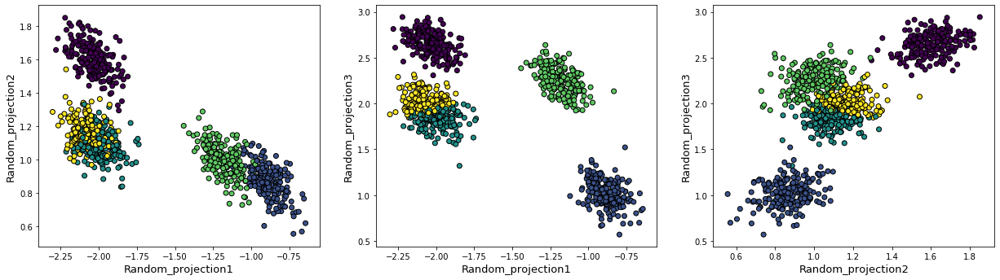

Score for iteration 8: -18.037530263451465
Silhouette score for iteration 8: 0.7118314711167896
V-measure score for iteration 8: 0.9882630023964304
----------------------------------------------------------------------------------------------------


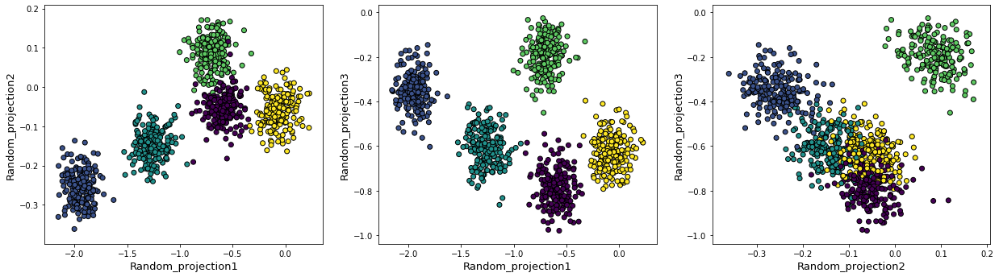

Score for iteration 9: -36.03833291688376
Silhouette score for iteration 9: 0.4840492072745363
V-measure score for iteration 9: 0.900311465674352
----------------------------------------------------------------------------------------------------


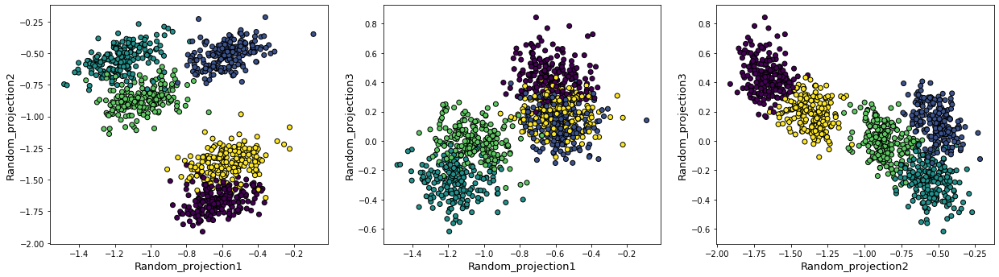

Score for iteration 10: -32.398040433317604
Silhouette score for iteration 10: 0.5989987623395747
V-measure score for iteration 10: 0.9688998962125298
----------------------------------------------------------------------------------------------------


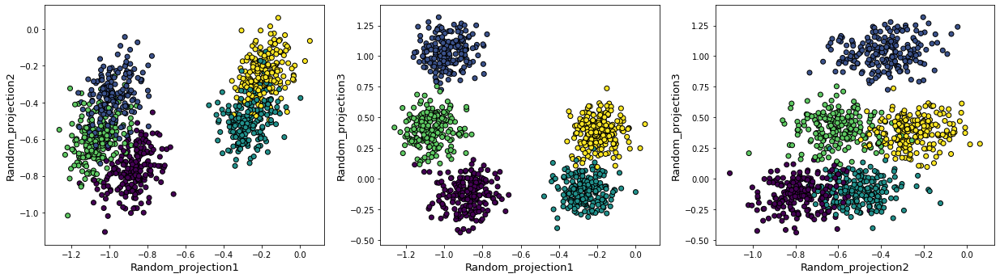

Score for iteration 11: -69.46060360011253
Silhouette score for iteration 11: 0.5050490068004096
V-measure score for iteration 11: 0.9058351274663673
----------------------------------------------------------------------------------------------------


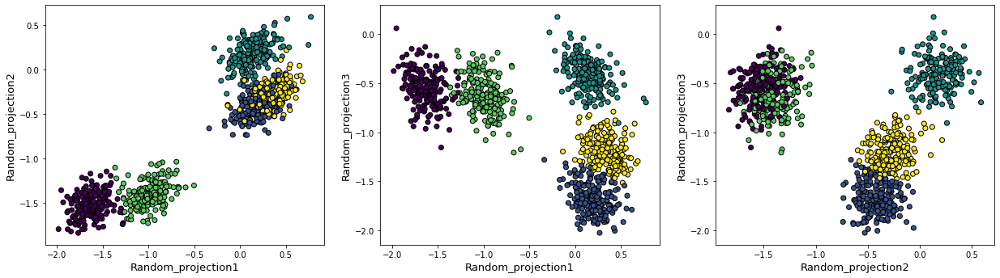

Score for iteration 12: -20.769536151969206
Silhouette score for iteration 12: 0.5832490230513281
V-measure score for iteration 12: 0.9369808113702158
----------------------------------------------------------------------------------------------------


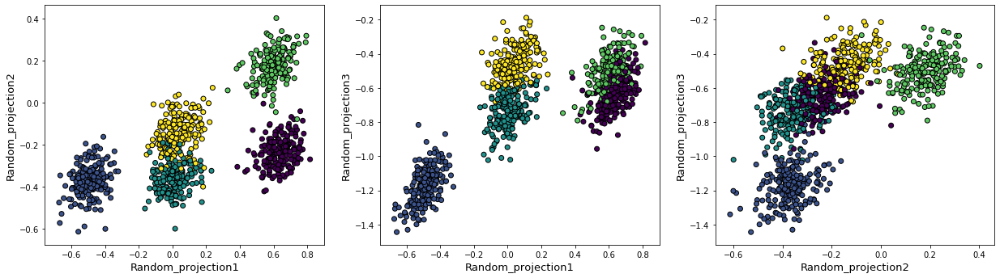

Score for iteration 13: -36.14705109886867
Silhouette score for iteration 13: 0.403424735705966
V-measure score for iteration 13: 0.7300835251242853
----------------------------------------------------------------------------------------------------


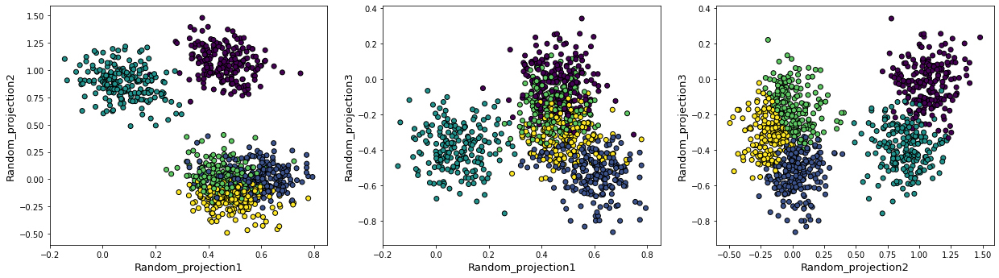

Score for iteration 14: -20.904989006483078
Silhouette score for iteration 14: 0.44335308551697594
V-measure score for iteration 14: 0.7408466805573835
----------------------------------------------------------------------------------------------------


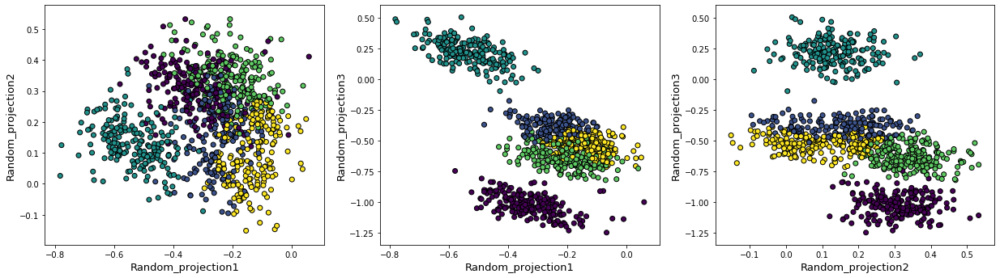

Score for iteration 15: -41.48522933265808
Silhouette score for iteration 15: 0.5954207344606118
V-measure score for iteration 15: 0.9804424951956257
----------------------------------------------------------------------------------------------------


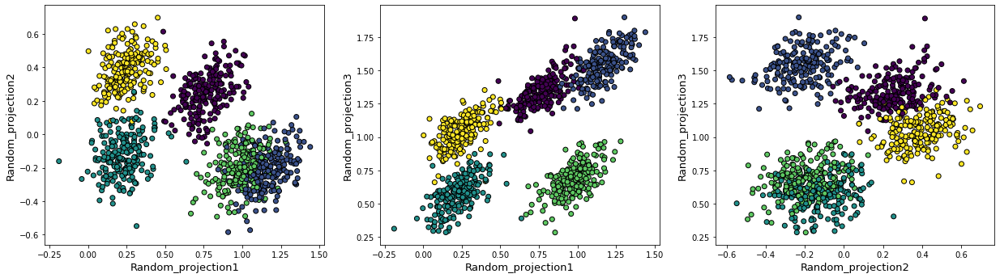

Score for iteration 16: -23.65102397482223
Silhouette score for iteration 16: 0.42957007125999785
V-measure score for iteration 16: 0.7477091167792774
----------------------------------------------------------------------------------------------------


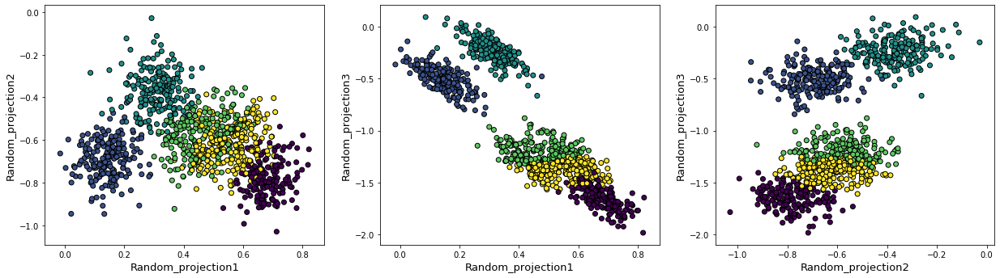

Score for iteration 17: -28.766081378991714
Silhouette score for iteration 17: 0.5816440827573381
V-measure score for iteration 17: 0.9554139606328602
----------------------------------------------------------------------------------------------------


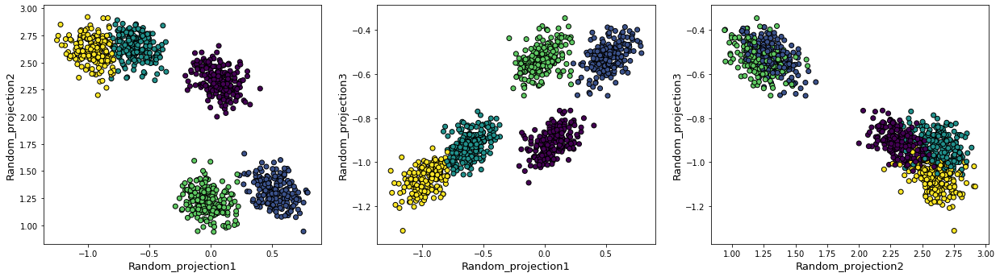

Score for iteration 18: -44.781598261457695
Silhouette score for iteration 18: 0.4904427023365879
V-measure score for iteration 18: 0.8535915777998798
----------------------------------------------------------------------------------------------------


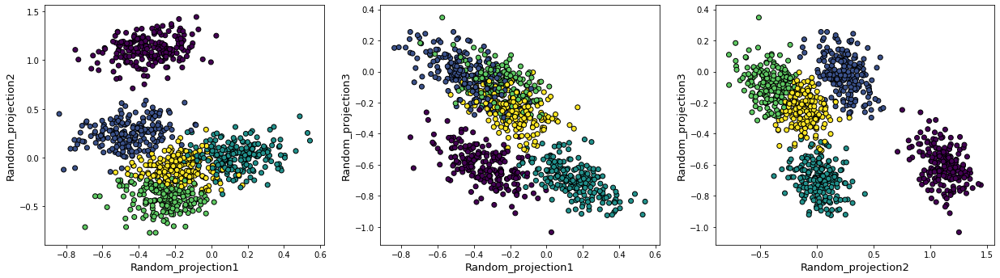

Score for iteration 19: -23.528315393544062
Silhouette score for iteration 19: 0.5054108768984358
V-measure score for iteration 19: 0.865440964959226
----------------------------------------------------------------------------------------------------


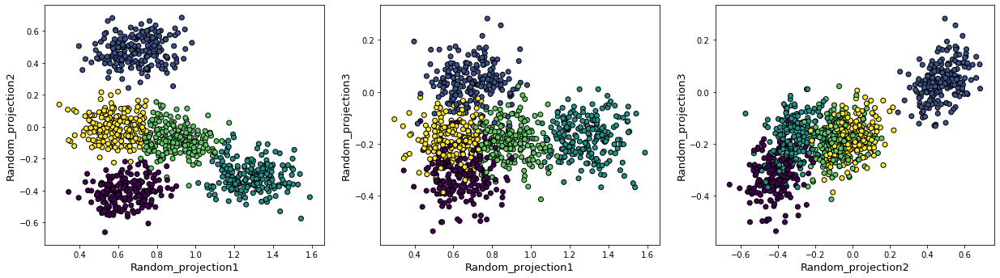

In [112]:
rp_score= []
rp_silhouette = []
rp_vmeasure = []
for i in range(20):
    random_proj = GaussianRandomProjection(n_components=n_random_comp)
    X_random_proj = random_proj.fit_transform(X_scaled)
    df_random_proj=pd.DataFrame(data=X_random_proj,columns=['Random_projection'+str(i) for i in range(1,n_random_comp+1)])
    
    km = KMeans(n_clusters=5, random_state=0).fit(X_random_proj)
    preds = km.predict(X_random_proj)
    print("Score for iteration {}: {}".format(i,km.score(X_random_proj)))
    rp_score.append(-km.score(X_random_proj))
    
    silhouette = silhouette_score(X_random_proj,preds)
    rp_silhouette.append(silhouette)
    print("Silhouette score for iteration {}: {}".format(i,silhouette))
    
    v_measure = v_measure_score(y,preds)
    rp_vmeasure.append(v_measure)
    print("V-measure score for iteration {}: {}".format(i,v_measure))
    print("-"*100)
    
    plot_cluster_rp(df_random_proj,preds)

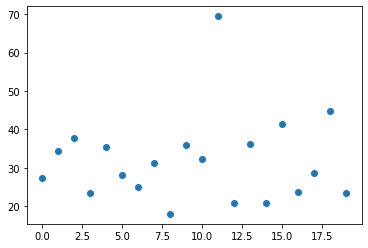

In [113]:
plt.scatter(x=[i for i in range(20)],y=rp_score)
plt.show()

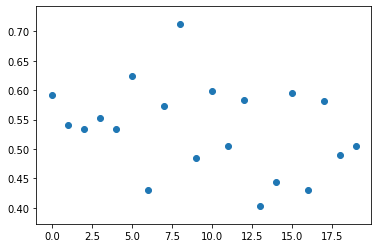

In [114]:
plt.scatter(x=[i for i in range(20)],y=rp_silhouette)
plt.show()

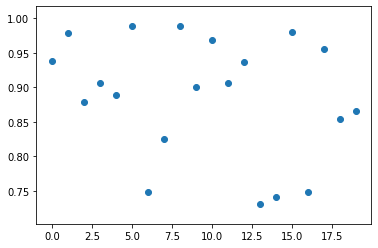

In [115]:
plt.scatter(x=[i for i in range(20)],y=rp_vmeasure)
plt.show()

### This kind of variation does not happen with PCA

In [128]:
pca_score= []
pca_silhouette = []
pca_vmeasure = []
for i in range(20):
    pca_partial = PCA(n_components=n_prin_comp,svd_solver='full')
    X_pca=pca_partial.fit_transform(X_scaled)
    km = KMeans(n_clusters=5, random_state=0).fit(X_pca)
    preds = km.predict(X_pca)
    print("Score for iteration {}: {}".format(i,km.score(X_pca)))
    pca_score.append(-km.score(X_pca))
    silhouette = silhouette_score(X_pca,preds)
    pca_silhouette.append(silhouette)
    print("Silhouette score for iteration {}: {}".format(i,silhouette))
    v_measure = v_measure_score(y,preds)
    pca_vmeasure.append(v_measure)
    print("V-measure score for iteration {}: {}".format(i,v_measure))
    print("-"*100)

Score for iteration 0: -14.377648593668487
Silhouette score for iteration 0: 0.7615028502529967
V-measure score for iteration 0: 1.0
----------------------------------------------------------------------------------------------------
Score for iteration 1: -14.377648593668487
Silhouette score for iteration 1: 0.7615028502529967
V-measure score for iteration 1: 1.0
----------------------------------------------------------------------------------------------------
Score for iteration 2: -14.377648593668487
Silhouette score for iteration 2: 0.7615028502529967
V-measure score for iteration 2: 1.0
----------------------------------------------------------------------------------------------------
Score for iteration 3: -14.377648593668487
Silhouette score for iteration 3: 0.7615028502529967
V-measure score for iteration 3: 1.0
----------------------------------------------------------------------------------------------------
Score for iteration 4: -14.377648593668487
Silhouette score for 

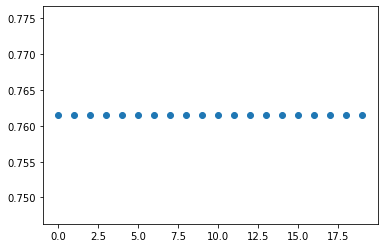

In [129]:
#len(pca_silhouette)
plt.scatter(x=[i for i in range(20)],y=pca_silhouette)
plt.show()

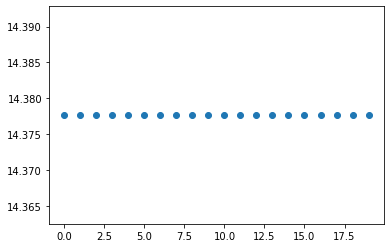

In [130]:
plt.scatter(x=[i for i in range(20)],y=pca_score)
plt.show()

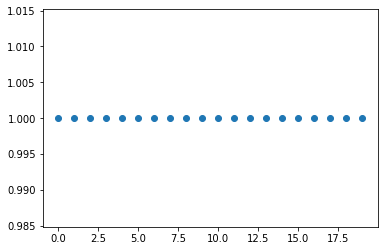

In [131]:
plt.scatter(x=[i for i in range(20)],y=pca_vmeasure)
plt.show()

not random